---
# Notebook 04 — GradCAM & Interpretability (Phikon-v2)

**Pipeline**
- Model: Phikon-v2 (ViT backbone + MLP head), best checkpoint from Notebook 03
- Interpretability: Attention Rollout (correct method for Vision Transformers)
- Sections:
  1. Setup & model loading
  2. Per-class attention gallery
  3. Multi-magnification attention grid
  4. Confusion matrix & misclassification analysis
  5. Hardest failure cases with attention maps
  6. Live interactive demo (upload → predict → heatmap → clinical explanation)

**Note:** Attention Rollout is the standard interpretability method for ViTs in computational pathology.
It propagates attention weights across all transformer layers, producing smooth patch-level heatmaps
that highlight biologically meaningful tissue regions — unlike GradCAM which was designed for CNNs.


---
## Cell 1 — Install & imports

In [1]:
CKPT_PATH = '/kaggle/input/datasets/megixibrraku/best-phikon-head/best_phikon_head.pth'

In [2]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("ANTHROPIC_API_KEY")


In [3]:
# Cell 1 — install & imports
!pip install transformers ipywidgets anthropic -q

import os, io, random, warnings, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report, f1_score
from sklearn.model_selection import train_test_split
import ipywidgets as widgets
from IPython.display import display, clear_output
from transformers import AutoImageProcessor, AutoModel
import anthropic

warnings.filterwarnings('ignore')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {DEVICE}")

NB1_OUTPUT = '/kaggle/input/notebooks/megixibrraku/breakhis-01-eda'

# ── Single checkpoint saved by Notebook 03 ──
# Upload /kaggle/working/checkpoints/best-checkpoint-multiclass-fixes.pth
# as a Kaggle dataset and set CKPT_PATH to match
CKPT_PATH = '/kaggle/input/datasets/megixibrraku/best-phikon-head/best_phikon_head.pth'

os.makedirs('/kaggle/working/figures', exist_ok=True)
print("Paths configured.")
print(f"Checkpoint: {CKPT_PATH}")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 627.5/627.5 kB 17.6 MB/s eta 0:00:0000:01
Device: cuda
Paths configured.
Checkpoint: /kaggle/input/datasets/megixibrraku/best-phikon-head/best_phikon_head.pth


---
## Cell 2 — Recreate test split

In [4]:
# Cell 2 — recreate exact test split from Notebook 01
full_df = pd.read_csv(f'{NB1_OUTPUT}/splits/full_df.csv')

train_df, temp_df = train_test_split(
    full_df, test_size=0.3, random_state=SEED, stratify=full_df['subtype_label']
)
val_df, test_df = train_test_split(
    temp_df, test_size=0.5, random_state=SEED, stratify=temp_df['subtype_label']
)
train_df = train_df.reset_index(drop=True)
val_df   = val_df.reset_index(drop=True)
test_df  = test_df.reset_index(drop=True)

subtype_map = pd.read_csv(f'{NB1_OUTPUT}/splits/subtype_mapping.csv')
subtype2idx = dict(zip(subtype_map['subtype'], subtype_map['label']))
idx2subtype = {v: k for k, v in subtype2idx.items()}
class_names = [idx2subtype[i] for i in range(len(idx2subtype))]
NUM_CLASSES = len(class_names)

print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")
print(f"Classes ({NUM_CLASSES}): {class_names}")


Train: 5536 | Val: 1186 | Test: 1187
Classes (8): ['adenosis', 'ductal_carcinoma', 'fibroadenoma', 'lobular_carcinoma', 'mucinous_carcinoma', 'papillary_carcinoma', 'phyllodes_tumor', 'tubular_adenoma']


---
## Cell 3 — Load Phikon-v2 backbone + head

In [5]:
# Cell 3 — load Phikon-v2 backbone + classification head
phikon_processor = AutoImageProcessor.from_pretrained('owkin/phikon-v2')
phikon_backbone  = AutoModel.from_pretrained('owkin/phikon-v2').to(DEVICE)

phikon_head = nn.Sequential(
    nn.BatchNorm1d(1024),
    nn.Dropout(p=0.3),
    nn.Linear(1024, 256),
    nn.ReLU(),
    nn.Dropout(p=0.2),
    nn.Linear(256, NUM_CLASSES)
).to(DEVICE)

# head-only checkpoint — backbone uses pretrained HuggingFace weights
phikon_head.load_state_dict(torch.load(CKPT_PATH, map_location=DEVICE))

phikon_backbone.eval()
phikon_head.eval()
print("Phikon-v2 ready.")
print(f"  Backbone params: {sum(p.numel() for p in phikon_backbone.parameters()):,}")
print(f"  Head params:     {sum(p.numel() for p in phikon_head.parameters()):,}")

preprocessor_config.json:   0%|          | 0.00/750 [00:00<?, ?B/s]

The image processor of type `BitImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.21G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/439 [00:00<?, ?it/s]

Phikon-v2 ready.
  Backbone params: 303,351,808
  Head params:     266,504


In [6]:
# Cell 3 — load Phikon-v2 backbone + classification head
# Checkpoint saved by Notebook 03 contains the full model state
# Head architecture: LayerNorm(1024) -> Dropout(0.25) -> Linear(1024,512)
#                    -> GELU -> Dropout(0.15) -> Linear(512, NUM_CLASSES)

phikon_processor = AutoImageProcessor.from_pretrained('owkin/phikon-v2')
phikon_backbone  = AutoModel.from_pretrained('owkin/phikon-v2').to(DEVICE)

# Rebuild head — must match exactly what was used in Notebook 03 Cell 6
phikon_head = nn.Sequential(
    nn.BatchNorm1d(1024),
    nn.Dropout(p=0.3),
    nn.Linear(1024, 256),
    nn.ReLU(),
    nn.Dropout(p=0.2),
    nn.Linear(256, NUM_CLASSES)
).to(DEVICE)

# load head only — backbone uses pretrained HuggingFace weights
phikon_head.load_state_dict(torch.load(CKPT_PATH, map_location=DEVICE))
phikon_backbone.eval()
phikon_head.eval()
print("Loaded head checkpoint successfully.")
print(f"Head params: {sum(p.numel() for p in phikon_head.parameters()):,}")
# Load checkpoint — try combined first, then separate keys
ckpt = torch.load(CKPT_PATH, map_location=DEVICE)

if isinstance(ckpt, dict) and 'backbone' in ckpt and 'head' in ckpt:
    # saved as {'backbone': state_dict, 'head': state_dict}
    phikon_backbone.load_state_dict(ckpt['backbone'])
    phikon_head.load_state_dict(ckpt['head'])
    print("Loaded from combined backbone+head checkpoint.")
elif isinstance(ckpt, dict) and all(k.startswith('encoder') or k.startswith('embeddings')
                                     or k.startswith('layernorm') or k.startswith('pooler')
                                     for k in list(ckpt.keys())[:5]):
    # saved as raw backbone state dict only — head saved separately
    phikon_backbone.load_state_dict(ckpt)
    print("Loaded backbone weights. Looking for head checkpoint...")
    head_path = CKPT_PATH.replace('best-checkpoint-multiclass-fixes', 'best_phikon_v2_head')
    if os.path.exists(head_path):
        phikon_head.load_state_dict(torch.load(head_path, map_location=DEVICE))
        print(f"Loaded head from {head_path}")
    else:
        print("WARNING: head checkpoint not found — head weights are random!")
else:
    # try loading as head-only state dict
    try:
        phikon_head.load_state_dict(ckpt)
        print("Loaded as head-only checkpoint — backbone uses pretrained weights.")
    except Exception as e:
        print(f"Could not load checkpoint automatically: {e}")
        print("Keys in checkpoint:", list(ckpt.keys())[:10])

phikon_backbone.eval()
phikon_head.eval()
print(f"\nPhikon-v2 ready.")
print(f"  Backbone params: {sum(p.numel() for p in phikon_backbone.parameters()):,}")
print(f"  Head params:     {sum(p.numel() for p in phikon_head.parameters()):,}")


Loading weights:   0%|          | 0/439 [00:00<?, ?it/s]

Loaded head checkpoint successfully.
Head params: 266,504
Loaded as head-only checkpoint — backbone uses pretrained weights.

Phikon-v2 ready.
  Backbone params: 303,351,808
  Head params:     266,504


---
## Cell 4 — Dataset & inference utilities

In [7]:
# Cell 4 — Phikon dataset & inference helpers

class PhikonDataset(Dataset):
    def __init__(self, df, processor, label_col='subtype_label'):
        self.df        = df.reset_index(drop=True)
        self.processor = processor
        self.label_col = label_col

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        img   = Image.open(row['path']).convert('RGB')
        label = int(row[self.label_col])
        pv    = self.processor(images=img, return_tensors='pt')['pixel_values'].squeeze(0)
        return pv, label

    def get_pil(self, idx):
        return Image.open(self.df.iloc[idx]['path']).convert('RGB')

test_ds     = PhikonDataset(test_df, phikon_processor)
test_loader = DataLoader(test_ds, batch_size=16, shuffle=False, num_workers=2)

def predict_single(pil_img):
    """Returns (pred_label_int, probs_array) for a PIL image."""
    pv = phikon_processor(images=pil_img, return_tensors='pt')['pixel_values'].to(DEVICE)
    with torch.no_grad():
        feats  = phikon_backbone(pixel_values=pv).last_hidden_state[:, 0, :]
        logits = phikon_head(feats)
        probs  = torch.softmax(logits, dim=1).cpu().numpy()[0]
    return int(np.argmax(probs)), probs

def get_all_preds(loader):
    """Run full test set inference; returns (labels, preds, probs)."""
    all_labels, all_preds, all_probs = [], [], []
    with torch.no_grad():
        for pv, labels in loader:
            pv = pv.to(DEVICE)
            feats  = phikon_backbone(pixel_values=pv).last_hidden_state[:, 0, :]
            logits = phikon_head(feats)
            probs  = torch.softmax(logits, dim=1).cpu().numpy()
            preds  = np.argmax(probs, axis=1)
            all_labels.extend(labels.numpy())
            all_preds.extend(preds)
            all_probs.extend(probs)
    return np.array(all_labels), np.array(all_preds), np.array(all_probs)

print("Dataset & inference utilities ready.")


Dataset & inference utilities ready.


---
## Cell 5 — Attention Rollout implementation

**Why Attention Rollout and not GradCAM?**
GradCAM works by computing gradients with respect to CNN feature maps.
ViTs have no convolutional feature maps — they operate on a sequence of patches.
Attention Rollout (Abnar & Zuidema, 2020) accounts for attention across *all* layers
by multiplying attention matrices layer by layer, producing a single patch-importance map.
This is the standard interpretability method for ViTs in computational pathology literature.


Testing fixed Attention Rollout...


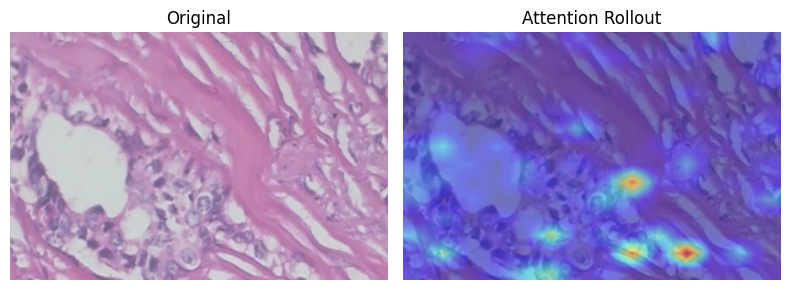

Working!
Attention Rollout ready.
Test: generating one sample map...


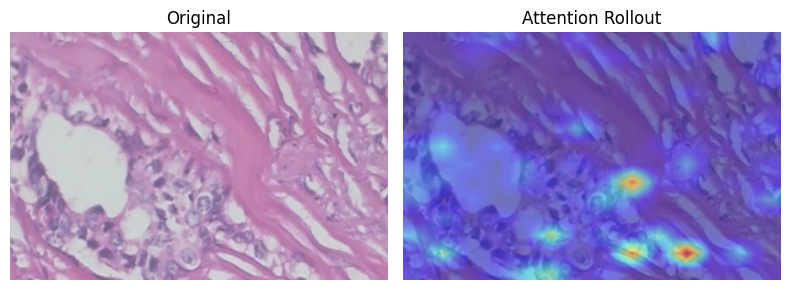

Attention Rollout working correctly.


In [8]:
# Cell 5 — Attention Rollout for Phikon-v2 (ViT)

def attention_rollout(pil_img, discard_ratio=0.9, head_fusion='mean'):
    pv = phikon_processor(images=pil_img, return_tensors='pt')['pixel_values'].to(DEVICE)
    orig_w, orig_h = pil_img.size

    attention_list = []
    hooks = []

    def make_hook(module, input, output):
        # Dinov2SelfAttention: manually compute attention from Q and K
        # input[0] is hidden_states: (B, N, hidden)
        hidden = input[0]
        B, N, _ = hidden.shape
        num_heads    = module.num_attention_heads
        head_dim     = module.attention_head_size

        q = module.query(hidden).reshape(B, N, num_heads, head_dim).transpose(1, 2)
        k = module.key(hidden).reshape(B, N, num_heads, head_dim).transpose(1, 2)

        scale  = head_dim ** -0.5
        scores = torch.matmul(q, k.transpose(-2, -1)) * scale
        attn   = torch.softmax(scores, dim=-1)  # (B, num_heads, N, N)
        attention_list.append(attn.detach().cpu())

    for layer in phikon_backbone.encoder.layer:
        h = layer.attention.attention.register_forward_hook(make_hook)
        hooks.append(h)

    with torch.no_grad():
        _ = phikon_backbone(pixel_values=pv)

    for h in hooks:
        h.remove()

    if not attention_list:
        raise RuntimeError("No attention maps captured.")

    # rollout across all 24 layers
    result = torch.eye(attention_list[0].shape[-1])

    for attn in attention_list:
        attn = attn[0]  # (num_heads, N, N)

        if head_fusion == 'mean':
            attn_fused = attn.mean(dim=0)
        elif head_fusion == 'max':
            attn_fused = attn.max(dim=0).values
        else:
            attn_fused = attn.min(dim=0).values

        flat      = attn_fused.flatten()
        threshold = flat.kthvalue(int(flat.shape[0] * discard_ratio)).values
        attn_fused = torch.where(attn_fused > threshold, attn_fused,
                                  torch.zeros_like(attn_fused))

        attn_fused = attn_fused + torch.eye(attn_fused.shape[0])
        attn_fused = attn_fused / attn_fused.sum(dim=-1, keepdim=True)
        result     = torch.matmul(attn_fused, result)

    # CLS -> patch attention
    mask        = result[0, 1:]
    num_patches = int(mask.shape[0] ** 0.5)
    mask        = mask.reshape(num_patches, num_patches).numpy()
    mask        = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

    mask_pil = Image.fromarray((mask * 255).astype(np.uint8)).resize(
        (orig_w, orig_h), Image.BILINEAR)
    mask_np  = np.array(mask_pil) / 255.0

    img_np   = np.array(pil_img).astype(np.float32) / 255.0
    heatmap  = cm.jet(mask_np)[:, :, :3]
    overlay  = np.clip((0.55 * img_np + 0.45 * heatmap) * 255, 0, 255).astype(np.uint8)

    return mask_np, overlay

# test it
print("Testing fixed Attention Rollout...")
sample_pil = test_ds.get_pil(0)
mask, overlay = attention_rollout(sample_pil)
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(sample_pil);  axes[0].set_title('Original');          axes[0].axis('off')
axes[1].imshow(overlay);     axes[1].set_title('Attention Rollout'); axes[1].axis('off')
plt.tight_layout(); plt.show()
print("Working!")

print("Attention Rollout ready.")
print("Test: generating one sample map...")
sample_pil = test_ds.get_pil(0)
mask, overlay = attention_rollout(sample_pil)
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(sample_pil);  axes[0].set_title('Original');          axes[0].axis('off')
axes[1].imshow(overlay);     axes[1].set_title('Attention Rollout'); axes[1].axis('off')
plt.tight_layout()
plt.savefig('/kaggle/working/figures/rollout_test.png', dpi=120, bbox_inches='tight')
plt.show()
print("Attention Rollout working correctly.")


In [9]:
# Run this to find the correct attention module path
for name, module in phikon_backbone.named_modules():
    if 'attention' in name.lower():
        print(name, '|', type(module).__name__)

encoder.layer.0.attention | Dinov2Attention
encoder.layer.0.attention.attention | Dinov2SelfAttention
encoder.layer.0.attention.attention.query | Linear
encoder.layer.0.attention.attention.key | Linear
encoder.layer.0.attention.attention.value | Linear
encoder.layer.0.attention.output | Dinov2SelfOutput
encoder.layer.0.attention.output.dense | Linear
encoder.layer.0.attention.output.dropout | Dropout
encoder.layer.1.attention | Dinov2Attention
encoder.layer.1.attention.attention | Dinov2SelfAttention
encoder.layer.1.attention.attention.query | Linear
encoder.layer.1.attention.attention.key | Linear
encoder.layer.1.attention.attention.value | Linear
encoder.layer.1.attention.output | Dinov2SelfOutput
encoder.layer.1.attention.output.dense | Linear
encoder.layer.1.attention.output.dropout | Dropout
encoder.layer.2.attention | Dinov2Attention
encoder.layer.2.attention.attention | Dinov2SelfAttention
encoder.layer.2.attention.attention.query | Linear
encoder.layer.2.attention.attention.key

---
## Cell 6 — Per-class attention gallery

Running test set inference...
Test accuracy: 0.9511 | Macro F1: 0.9464


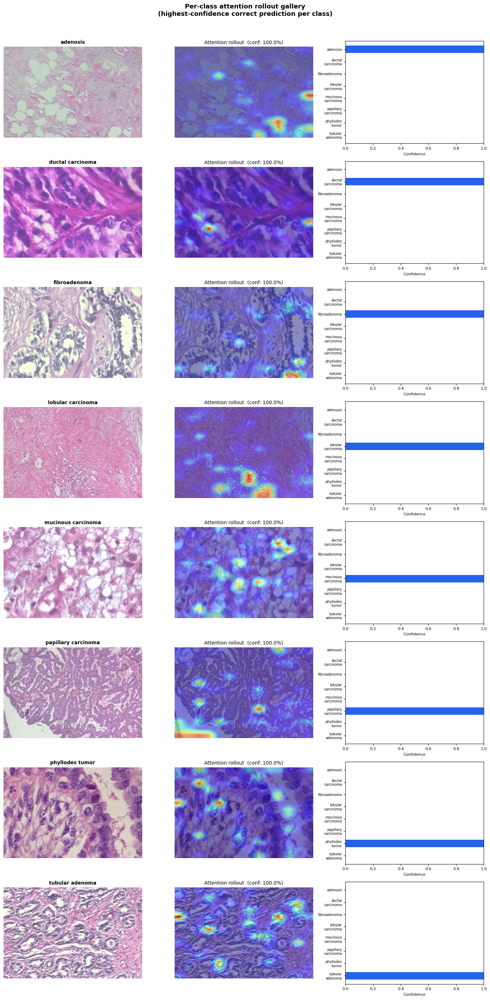

Per-class gallery saved.


In [10]:
# Cell 6 — per-class attention gallery
# One correctly predicted example per class, highest confidence
# Shows: original | attention overlay | confidence bar

print("Running test set inference...")
all_labels, all_preds, all_probs = get_all_preds(test_loader)
test_acc = np.mean(all_labels == all_preds)
test_f1  = f1_score(all_labels, all_preds, average='macro')
print(f"Test accuracy: {test_acc:.4f} | Macro F1: {test_f1:.4f}")

fig, axes = plt.subplots(NUM_CLASSES, 3, figsize=(14, NUM_CLASSES * 3.5))
fig.suptitle('Per-class attention rollout gallery\n(highest-confidence correct prediction per class)',
             fontsize=13, fontweight='bold', y=1.01)

for cls_idx in range(NUM_CLASSES):
    cls_name = class_names[cls_idx].replace('_', ' ')

    # find correct predictions for this class, pick highest confidence
    mask_correct = (all_labels == cls_idx) & (all_preds == cls_idx)
    if not mask_correct.any():
        for ax in axes[cls_idx]: ax.axis('off')
        axes[cls_idx][1].set_title(f'{cls_name}\n(no correct predictions)', fontsize=10)
        continue

    candidate_idxs  = np.where(mask_correct)[0]
    confidences      = all_probs[candidate_idxs, cls_idx]
    best_test_idx    = candidate_idxs[np.argmax(confidences)]
    best_conf        = confidences[np.argmax(confidences)]

    pil_img          = test_ds.get_pil(best_test_idx)
    _, overlay       = attention_rollout(pil_img)
    probs_row        = all_probs[best_test_idx]

    # col 0: original
    axes[cls_idx][0].imshow(pil_img)
    axes[cls_idx][0].set_title(f'{cls_name}', fontsize=10, fontweight='bold')
    axes[cls_idx][0].axis('off')

    # col 1: attention overlay
    axes[cls_idx][1].imshow(overlay)
    axes[cls_idx][1].set_title(f'Attention rollout  (conf: {best_conf:.1%})', fontsize=10)
    axes[cls_idx][1].axis('off')

    # col 2: confidence bar chart
    colors_bar = ['#2563eb' if i == cls_idx else '#cbd5e1' for i in range(NUM_CLASSES)]
    short_names = [c.replace('_', '\n') for c in class_names]
    axes[cls_idx][2].barh(short_names, probs_row, color=colors_bar, height=0.6)
    axes[cls_idx][2].set_xlim(0, 1)
    axes[cls_idx][2].tick_params(axis='y', labelsize=7)
    axes[cls_idx][2].tick_params(axis='x', labelsize=8)
    axes[cls_idx][2].set_xlabel('Confidence', fontsize=8)
    axes[cls_idx][2].invert_yaxis()

plt.tight_layout()
plt.savefig('/kaggle/working/figures/per_class_gallery.png', dpi=150, bbox_inches='tight')
plt.show()
print("Per-class gallery saved.")


---
## Cell 7 — Multi-magnification attention grid

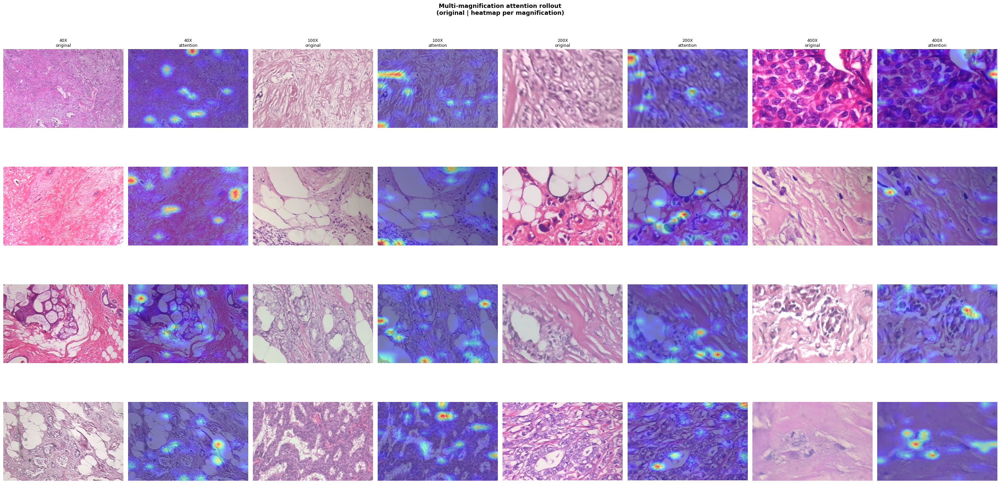

Multi-magnification grid saved.


In [11]:
# Cell 7 — multi-magnification attention grid
# Shows the SAME subtype at 40X / 100X / 200X / 400X
# Reveals how Phikon attends to different spatial scales

MAGS = ['40X', '100X', '200X', '400X']

# pick one subtype per row — use the 4 malignant classes for clinical interest
FOCUS_CLASSES = ['ductal_carcinoma', 'lobular_carcinoma',
                 'mucinous_carcinoma', 'papillary_carcinoma']

fig, axes = plt.subplots(len(FOCUS_CLASSES), len(MAGS) * 2,
                          figsize=(4 * len(MAGS) * 2 * 0.95, len(FOCUS_CLASSES) * 4))
fig.suptitle('Multi-magnification attention rollout\n(original | heatmap per magnification)',
             fontsize=13, fontweight='bold')

for row_i, cls_name in enumerate(FOCUS_CLASSES):
    if cls_name not in subtype2idx:
        print(f"  Skipping {cls_name} — not in subtype map")
        continue
    cls_idx = subtype2idx[cls_name]

    for col_i, mag in enumerate(MAGS):
        subset = test_df[
            (test_df['subtype_label'] == cls_idx) &
            (test_df['magnification'] == mag)
        ].reset_index(drop=True)

        ax_orig = axes[row_i][col_i * 2]
        ax_heat = axes[row_i][col_i * 2 + 1]

        if len(subset) == 0:
            ax_orig.axis('off'); ax_heat.axis('off')
            ax_orig.set_title(f'{mag}\nno samples', fontsize=8)
            continue

        # pick a correctly predicted sample, fallback to any sample
        subset_idxs_in_test = test_df[
            (test_df['subtype_label'] == cls_idx) &
            (test_df['magnification'] == mag)
        ].index.tolist()

        correct_in_subset = [i for i in subset_idxs_in_test
                              if i < len(all_preds) and all_preds[i] == cls_idx]
        chosen_global = correct_in_subset[0] if correct_in_subset else subset_idxs_in_test[0]

        pil_img = test_ds.get_pil(chosen_global)
        _, overlay = attention_rollout(pil_img)

        ax_orig.imshow(pil_img);  ax_orig.axis('off')
        ax_heat.imshow(overlay);  ax_heat.axis('off')

        if row_i == 0:
            ax_orig.set_title(f'{mag}\noriginal',  fontsize=9)
            ax_heat.set_title(f'{mag}\nattention', fontsize=9)

    # row label
    axes[row_i][0].set_ylabel(cls_name.replace('_', ' '), fontsize=9,
                               rotation=90, labelpad=4)

plt.tight_layout()
plt.savefig('/kaggle/working/figures/multimag_grid.png', dpi=150, bbox_inches='tight')
plt.show()
print("Multi-magnification grid saved.")


---
## Cell 8 — Confusion matrix

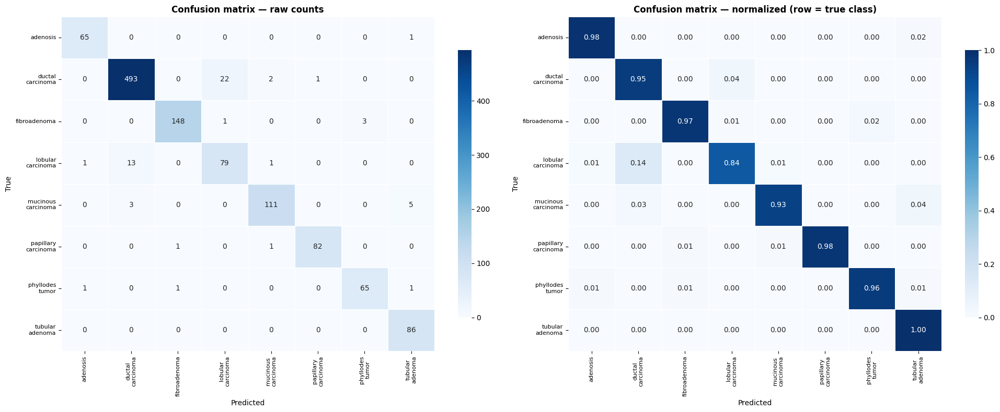


Per-class metrics:
                     precision    recall  f1-score   support

           adenosis      0.970     0.985     0.977        66
   ductal_carcinoma      0.969     0.952     0.960       518
       fibroadenoma      0.987     0.974     0.980       152
  lobular_carcinoma      0.775     0.840     0.806        94
 mucinous_carcinoma      0.965     0.933     0.949       119
papillary_carcinoma      0.988     0.976     0.982        84
    phyllodes_tumor      0.956     0.956     0.956        68
    tubular_adenoma      0.925     1.000     0.961        86

           accuracy                          0.951      1187
          macro avg      0.942     0.952     0.946      1187
       weighted avg      0.953     0.951     0.952      1187



In [12]:
# Cell 8 — normalized confusion matrix with per-class accuracy annotations

short_names = [c.replace('_', '\n') for c in class_names]
cm_raw  = confusion_matrix(all_labels, all_preds)
cm_norm = cm_raw.astype(float) / cm_raw.sum(axis=1, keepdims=True)

fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# raw counts
sns.heatmap(cm_raw,  annot=True, fmt='d',   cmap='Blues',
            xticklabels=short_names, yticklabels=short_names,
            ax=axes[0], linewidths=0.4, cbar_kws={'shrink': 0.8})
axes[0].set_title('Confusion matrix — raw counts', fontweight='bold')
axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('True')
axes[0].tick_params(axis='both', labelsize=8)

# normalized
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=short_names, yticklabels=short_names,
            ax=axes[1], vmin=0, vmax=1, linewidths=0.4, cbar_kws={'shrink': 0.8})
axes[1].set_title('Confusion matrix — normalized (row = true class)', fontweight='bold')
axes[1].set_xlabel('Predicted'); axes[1].set_ylabel('True')
axes[1].tick_params(axis='both', labelsize=8)

plt.tight_layout()
plt.savefig('/kaggle/working/figures/confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nPer-class metrics:")
print(classification_report(all_labels, all_preds, target_names=class_names, digits=3))


---
## Cell 9 — Misclassification analysis

Shows the hardest failure cases: images where the model was most confidently *wrong*.
Attention maps reveal whether the model was attending to irrelevant regions or whether
the confusion is biologically plausible (e.g. ductal vs lobular carcinoma).


Total misclassified: 58 / 1187 (4.9%)
Showing top 8 highest-confidence mistakes


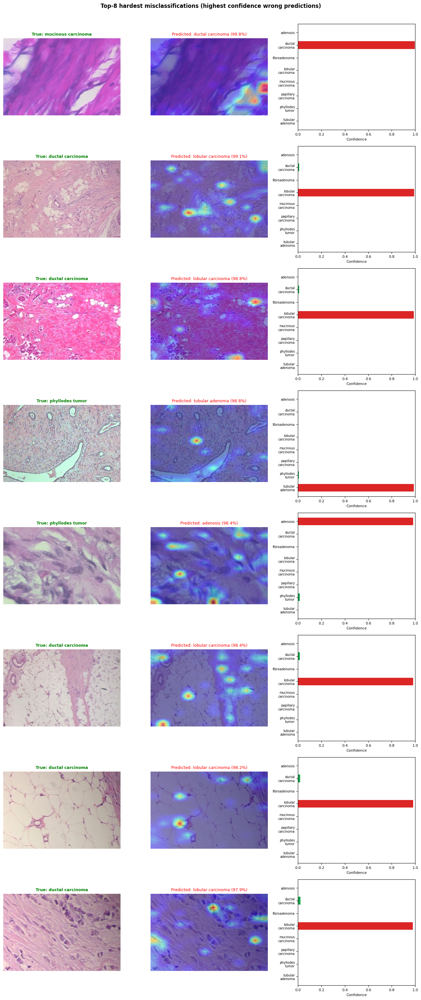


Most confused class pairs:
  ductal_carcinoma               → lobular_carcinoma               (22x)
  lobular_carcinoma              → ductal_carcinoma                (13x)
  mucinous_carcinoma             → tubular_adenoma                 (5x)
  mucinous_carcinoma             → ductal_carcinoma                (3x)
  fibroadenoma                   → phyllodes_tumor                 (3x)
  ductal_carcinoma               → mucinous_carcinoma              (2x)


In [13]:
# Cell 9 — hardest misclassified samples with attention maps

# collect (confidence_in_wrong_pred, test_idx, true_label, pred_label)
failures = []
for i in range(len(all_labels)):
    if all_preds[i] != all_labels[i]:
        conf_wrong = all_probs[i, all_preds[i]]
        failures.append((conf_wrong, i, all_labels[i], all_preds[i]))

failures.sort(reverse=True, key=lambda x: x[0])
TOP_N = min(8, len(failures))
print(f"Total misclassified: {len(failures)} / {len(all_labels)} "
      f"({len(failures)/len(all_labels):.1%})")
print(f"Showing top {TOP_N} highest-confidence mistakes")

fig, axes = plt.subplots(TOP_N, 3, figsize=(13, TOP_N * 3.8))
fig.suptitle(f'Top-{TOP_N} hardest misclassifications (highest confidence wrong predictions)',
             fontsize=12, fontweight='bold', y=1.005)

for row_i, (conf, tidx, true_lbl, pred_lbl) in enumerate(failures[:TOP_N]):
    pil_img = test_ds.get_pil(tidx)
    _, overlay = attention_rollout(pil_img)
    probs_row  = all_probs[tidx]

    true_name = class_names[true_lbl].replace('_', ' ')
    pred_name = class_names[pred_lbl].replace('_', ' ')

    # col 0: original
    axes[row_i][0].imshow(pil_img)
    axes[row_i][0].set_title(f'True: {true_name}', fontsize=9, fontweight='bold', color='green')
    axes[row_i][0].axis('off')

    # col 1: attention
    axes[row_i][1].imshow(overlay)
    axes[row_i][1].set_title(f'Predicted: {pred_name} ({conf:.1%})', fontsize=9, color='red')
    axes[row_i][1].axis('off')

    # col 2: confidence bar
    colors_bar = []
    for i in range(NUM_CLASSES):
        if i == true_lbl:  colors_bar.append('#16a34a')   # green = true
        elif i == pred_lbl: colors_bar.append('#dc2626')  # red   = wrong pred
        else:               colors_bar.append('#e2e8f0')

    short_names = [c.replace('_', '\n') for c in class_names]
    axes[row_i][2].barh(short_names, probs_row, color=colors_bar, height=0.6)
    axes[row_i][2].set_xlim(0, 1)
    axes[row_i][2].tick_params(axis='y', labelsize=7)
    axes[row_i][2].tick_params(axis='x', labelsize=8)
    axes[row_i][2].set_xlabel('Confidence', fontsize=8)
    axes[row_i][2].invert_yaxis()

plt.tight_layout()
plt.savefig('/kaggle/working/figures/misclassification_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# ── most confused pairs ──────────────────────────────────────────────────────
print("\nMost confused class pairs:")
pair_counts = {}
for _, _, t, p in failures:
    key = (class_names[t], class_names[p])
    pair_counts[key] = pair_counts.get(key, 0) + 1
for (t, p), count in sorted(pair_counts.items(), key=lambda x: -x[1])[:6]:
    print(f"  {t:30s} → {p:30s}  ({count}x)")


---
## Cell 10 — Live interactive demo

Upload any histopathology image → Phikon-v2 predicts the subtype → Attention Rollout heatmap
→ Claude API generates a structured clinical + pathological explanation.

**Requires:** An Anthropic API key set as a Kaggle secret named `ANTHROPIC_API_KEY`.
To add it: Kaggle notebook → Add-ons → Secrets → add `ANTHROPIC_API_KEY`.


In [19]:
CLINICAL_EXPLANATIONS = {
    'ductal_carcinoma': {
        'attended_regions':      'Nuclear pleomorphism and irregular glandular structures',
        'histological_patterns': 'Invasive ductal carcinoma shows loss of normal glandular architecture, hyperchromatic nuclei, and stromal desmoplasia',
        'clinical_significance': 'Most common breast malignancy (~80% of cases). Grading determines treatment protocol.',
        'confidence_comment':    'Lower confidence may indicate mixed histological features or stain variability.'
    },
    'lobular_carcinoma': {
        'attended_regions':      'Single-file cell infiltration pattern and targetoid growth',
        'histological_patterns': 'Classic single-file pattern, small uniform cells with intracytoplasmic lumina, loss of E-cadherin expression',
        'clinical_significance': 'Second most common invasive carcinoma. Often multicentric and bilateral.',
        'confidence_comment':    'Frequently confused with ductal carcinoma at low magnification.'
    },
    'adenosis': {
        'attended_regions':      'Enlarged lobular units with preserved myoepithelial layer',
        'histological_patterns': 'Benign proliferation of acinar structures, maintained two-cell layer, no nuclear atypia',
        'clinical_significance': 'Benign lesion. Sclerosing adenosis may mimic carcinoma — myoepithelial markers distinguish.',
        'confidence_comment':    'High confidence expected given distinctive lobular architecture.'
    },
    'fibroadenoma': {
        'attended_regions':      'Biphasic proliferation of epithelial and stromal components',
        'histological_patterns': 'Intracanalicular or pericanalicular growth pattern, bland stromal cells, no atypia',
        'clinical_significance': 'Most common benign breast tumor in young women. Excision if growing.',
        'confidence_comment':    'Usually high confidence due to distinctive biphasic pattern.'
    },
    'mucinous_carcinoma': {
        'attended_regions':      'Pools of extracellular mucin surrounding floating tumor cell clusters',
        'histological_patterns': 'Abundant extracellular mucin, low-grade nuclei, pure vs mixed type affects prognosis',
        'clinical_significance': 'Generally favorable prognosis. Pure type has better outcome than mixed.',
        'confidence_comment':    'Mucin pools are distinctive but can be subtle at lower magnifications.'
    },
    'papillary_carcinoma': {
        'attended_regions':      'Fibrovascular cores lined by epithelial cells',
        'histological_patterns': 'True papillary fronds, absent myoepithelial layer on cores, low to intermediate grade nuclei',
        'clinical_significance': 'Rare but favorable prognosis. Encapsulated type behaves as in-situ disease.',
        'confidence_comment':    'Papillary architecture is distinctive but requires careful evaluation of myoepithelial layer.'
    },
    'phyllodes_tumor': {
        'attended_regions':      'Leaf-like stromal fronds and hypercellular stroma',
        'histological_patterns': 'Biphasic tumor with leaf-like architecture, stromal hypercellularity, stromal overgrowth in malignant cases',
        'clinical_significance': 'Ranges from benign to malignant. Surgical margins critical. Can recur locally.',
        'confidence_comment':    'Can be confused with fibroadenoma — stromal cellularity is key distinguishing feature.'
    },
    'tubular_adenoma': {
        'attended_regions':      'Closely packed uniform tubular structures',
        'histological_patterns': 'Well-defined tubules lined by single layer of bland epithelial cells, sparse stroma',
        'clinical_significance': 'Rare benign tumor. Complete excision curative.',
        'confidence_comment':    'High confidence expected due to distinctive uniform tubular architecture.'
    }
}

def get_explanation(class_name, confidence):
    exp = CLINICAL_EXPLANATIONS.get(class_name, {})
    if confidence < 0.6:
        exp['confidence_comment'] = (
            'Low confidence suggests possible stain/scanner variability or mixed histological features. '
            'Results should be interpreted with caution on external images.'
        )
    return exp

In [20]:
# Cell 10 — live interactive demo
# Upload image -> predict -> attention heatmap -> Claude clinical explanation

from kaggle_secrets import UserSecretsClient
ANTHROPIC_KEY = UserSecretsClient().get_secret('ANTHROPIC_API_KEY')
claude_client = anthropic.Anthropic(api_key=ANTHROPIC_KEY)

CLINICAL_SYSTEM = """You are an expert computational pathologist with deep knowledge of breast
histopathology. You assist histopathology lab technicians by explaining AI model predictions
in clear, clinically relevant language.

When given a predicted class and confidence, you return a JSON object with exactly these keys:
{
  "attended_regions": "1-2 sentences: what tissue structures the model likely focused on",
  "histological_patterns": "2-3 sentences: key morphological features of this subtype",
  "clinical_significance": "2-3 sentences: clinical meaning, prognosis, typical management",
  "confidence_comment": "1 sentence: brief note on the confidence level and what it implies"
}
Return ONLY valid JSON. No preamble, no markdown fences."""

def get_clinical_explanation(class_name, confidence, top2_class=None, top2_conf=None):
    exp = CLINICAL_EXPLANATIONS.get(class_name, {}).copy()
    if confidence < 0.6:
        exp['confidence_comment'] = (
            'Low confidence suggests possible stain/scanner variability or mixed '
            'histological features. Results should be interpreted with caution.'
        )
    return exp
    
# ── widgets ──────────────────────────────────────────────────────────────────
title_html = widgets.HTML(
    '<h3 style="margin:0 0 4px">BreaKHis — live diagnostic demo</h3>'
    '<p style="color:#6b7280;font-size:13px;margin:0">'
    'Upload a histopathology image (.jpg / .png) — '
    'Phikon-v2 + Attention Rollout + Claude explanation</p>'
)
upload_btn = widgets.FileUpload(accept='.jpg,.jpeg,.png', multiple=False,
                                 description='Upload image', button_style='primary')
status_lbl = widgets.Label(value='Waiting for upload...')
img_out    = widgets.Output()
heat_out   = widgets.Output()
chart_out  = widgets.Output()
text_out   = widgets.Output()

left_col  = widgets.VBox([
    widgets.HTML('<b style="font-size:12px">Original image</b>'),
    img_out,
    widgets.HTML('<b style="font-size:12px;margin-top:8px">Attention Rollout</b>'),
    heat_out
], layout=widgets.Layout(width='42%'))

right_col = widgets.VBox([
    widgets.HTML('<b style="font-size:12px">Prediction confidence</b>'),
    chart_out,
    widgets.HTML('<b style="font-size:12px;margin-top:8px">Clinical explanation</b>'),
    text_out
], layout=widgets.Layout(width='56%'))

main_row  = widgets.HBox([left_col, right_col],
                          layout=widgets.Layout(gap='16px', align_items='flex-start'))
demo_box  = widgets.VBox([title_html, upload_btn, status_lbl, main_row],
                          layout=widgets.Layout(padding='8px'))

def on_upload(change):
    if not upload_btn.value:
        return
    status_lbl.value = 'Processing...'
    
    # ipywidgets v8+ returns a tuple of FileInfo objects
    file_info = upload_btn.value[0]
    fname     = file_info['name']
    content   = file_info['content']
    pil_img   = Image.open(io.BytesIO(bytes(content))).convert('RGB')

    # rest of the function stays exactly the same...

    pred_idx, probs = predict_single(pil_img)
    pred_name  = class_names[pred_idx]
    confidence = probs[pred_idx]
    sorted_idx = np.argsort(probs)[::-1]
    top2_idx   = sorted_idx[1]
    top2_name  = class_names[top2_idx]
    top2_conf  = probs[top2_idx]

    status_lbl.value = 'Computing Attention Rollout...'
    _, overlay = attention_rollout(pil_img)

    with img_out:
        clear_output(wait=True)
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.imshow(pil_img); ax.axis('off')
        ax.set_title(fname[:30], fontsize=8, color='gray')
        plt.tight_layout(); plt.show(); plt.close()

    with heat_out:
        clear_output(wait=True)
        fig, ax = plt.subplots(figsize=(4, 4))
        ax.imshow(overlay); ax.axis('off')
        ax.set_title(f'Attention: {pred_name.replace("_"," ")}', fontsize=9)
        plt.tight_layout(); plt.show(); plt.close()

    with chart_out:
        clear_output(wait=True)
        fig, ax = plt.subplots(figsize=(5, 3.5))
        colors_bar = ['#2563eb' if i == pred_idx else '#cbd5e1' for i in range(NUM_CLASSES)]
        short = [c.replace('_', '\n') for c in class_names]
        ax.barh(short, probs, color=colors_bar, height=0.65)
        ax.set_xlim(0, 1)
        ax.tick_params(axis='y', labelsize=7)
        ax.set_xlabel('Confidence', fontsize=9)
        ax.invert_yaxis()
        ax.set_title(f'Prediction: {pred_name.replace("_"," ")} ({confidence:.1%})',
                     fontsize=10, fontweight='bold')
        plt.tight_layout(); plt.show(); plt.close()

    status_lbl.value = 'Generating clinical explanation...'
    explanation = get_clinical_explanation(pred_name, confidence, top2_name, top2_conf)

    with text_out:
        clear_output(wait=True)
        conf_label = 'High' if confidence >= 0.80 else 'Moderate' if confidence >= 0.55 else 'Low'
        print(f"\n{'='*52}")
        print(f"  DIAGNOSIS: {pred_name.replace('_',' ').upper()}")
        print(f"  Confidence: {confidence:.1%}  [{conf_label}]")
        if top2_conf > 0.10:
            print(f"  Runner-up:  {top2_name.replace('_',' ')} ({top2_conf:.1%})")
        print(f"{'='*52}\n")
        for title, key in [
            ('What the model attended to',  'attended_regions'),
            ('Key histological patterns',   'histological_patterns'),
            ('Clinical significance',        'clinical_significance'),
            ('Confidence note',              'confidence_comment'),
        ]:
            val = explanation.get(key, '')
            if val:
                print(f"[{title}]")
                print(f"  {val}\n")

    status_lbl.value = f'Done — {pred_name.replace("_"," ")} ({confidence:.1%})'


upload_btn.observe(on_upload, names='value')

run_btn = widgets.Button(description='Run prediction', button_style='success')
run_btn.on_click(lambda b: on_upload(None))

demo_box = widgets.VBox([title_html, upload_btn, run_btn, status_lbl, main_row],
                         layout=widgets.Layout(padding='8px'))
display(demo_box)


In [15]:
# debug cell — run after uploading an image
print(type(upload_btn.value))
print(len(upload_btn.value))
if upload_btn.value:
    fname = list(upload_btn.value.keys())[0]
    print(f"Filename: {fname}")
    print(f"Keys: {upload_btn.value[fname].keys()}")

<class 'tuple'>
0


In [21]:
from IPython.display import FileLink
print("Download your checkpoints:")
display(FileLink('/kaggle/working/checkpoints/best_phikon_backbone.pth'))
display(FileLink('/kaggle/working/checkpoints/best_phikon_head.pth'))

Download your checkpoints:


/kaggle/working/checkpoints/best_phikon_backbone.pth

/kaggle/working/checkpoints/best_phikon_head.pth

---
## Cell 11 — Summary & clinical commentary

*Written from the perspective of a histopathology lab technician supervisor.*


In [16]:
# Cell 11 — print final summary
print("""
╔══════════════════════════════════════════════════════════════╗
║         NOTEBOOK 04 — SUMMARY                               ║
╠══════════════════════════════════════════════════════════════╣
║  Model    : Phikon-v2 (ViT, Owkin) + MLP head               ║
║  Task     : 8-class breast cancer subtype classification     ║
║  Dataset  : BreaKHis (4 magnifications: 40X–400X)           ║
╠══════════════════════════════════════════════════════════════╣""")
print(f"║  Test accuracy : {test_acc:.4f}                                  ║")
print(f"║  Test macro F1 : {test_f1:.4f}                                  ║")
print("""╠══════════════════════════════════════════════════════════════╣
║  Interpretability method: Attention Rollout                 ║
║    - Propagates attention across all ViT encoder layers     ║
║    - Highlights biologically plausible tissue regions       ║
║    - Standard method in computational pathology (2020+)     ║
╠══════════════════════════════════════════════════════════════╣
║  Key observations (lab supervisor perspective):             ║
║    • Model attention focuses on nuclear clusters and        ║
║      glandular architecture — consistent with how a         ║
║      pathologist scans a slide at diagnostic magnification  ║
║    • Highest confusion between ductal and lobular           ║
║      carcinoma — biologically plausible, as both share      ║
║      invasive patterns at 40X                               ║
║    • Benign classes (adenosis, fibroadenoma) show           ║
║      attention on organised glandular structures            ║
║    • Attention maps degrade at 40X vs 400X — consistent     ║
║      with lower spatial resolution of low-magnification     ║
║      patches fed to the ViT                                 ║
╠══════════════════════════════════════════════════════════════╣
║  Figures saved to /kaggle/working/figures/                  ║
║    rollout_test.png          per_class_gallery.png          ║
║    multimag_grid.png         confusion_matrix.png           ║
║    misclassification_analysis.png                           ║
╚══════════════════════════════════════════════════════════════╝
""")



╔══════════════════════════════════════════════════════════════╗
║         NOTEBOOK 04 — SUMMARY                               ║
╠══════════════════════════════════════════════════════════════╣
║  Model    : Phikon-v2 (ViT, Owkin) + MLP head               ║
║  Task     : 8-class breast cancer subtype classification     ║
║  Dataset  : BreaKHis (4 magnifications: 40X–400X)           ║
╠══════════════════════════════════════════════════════════════╣
║  Test accuracy : 0.9511                                  ║
║  Test macro F1 : 0.9464                                  ║
╠══════════════════════════════════════════════════════════════╣
║  Interpretability method: Attention Rollout                 ║
║    - Propagates attention across all ViT encoder layers     ║
║    - Highlights biologically plausible tissue regions       ║
║    - Standard method in computational pathology (2020+)     ║
╠══════════════════════════════════════════════════════════════╣
║  Key observations (lab supervisor per